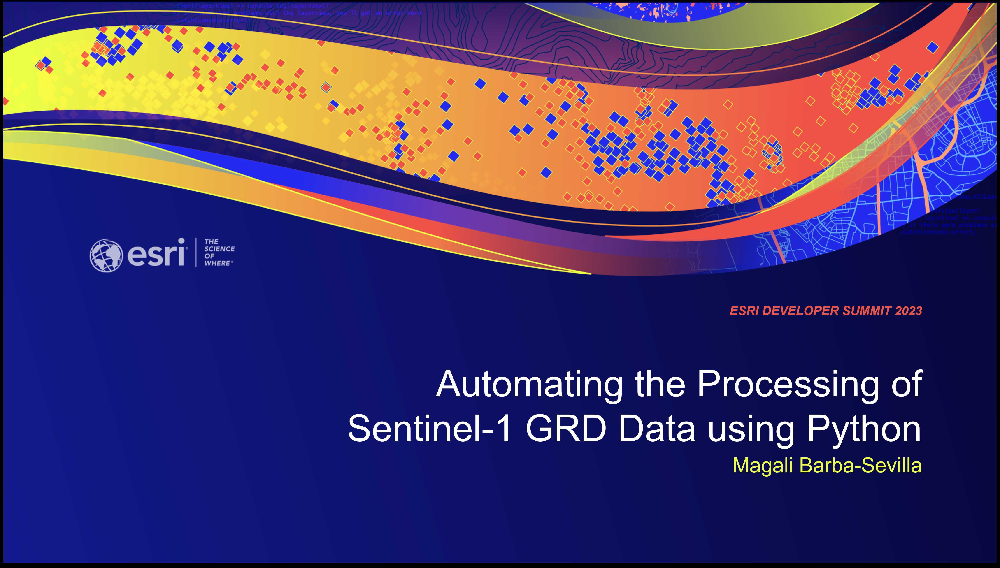

# SAR Capabilities: Frequent and Consistent Observations
&nbsp;
<div>
    <center>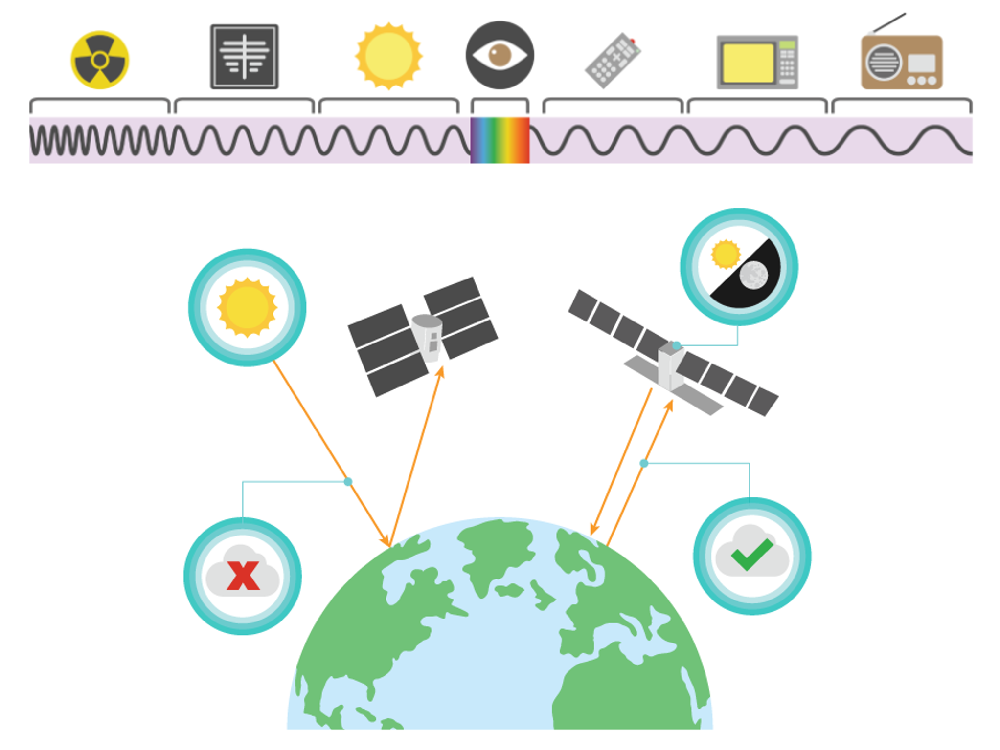</center>
</div>


# SAR Capabilities: Unique View of Earth's Surface
<div>
    <center>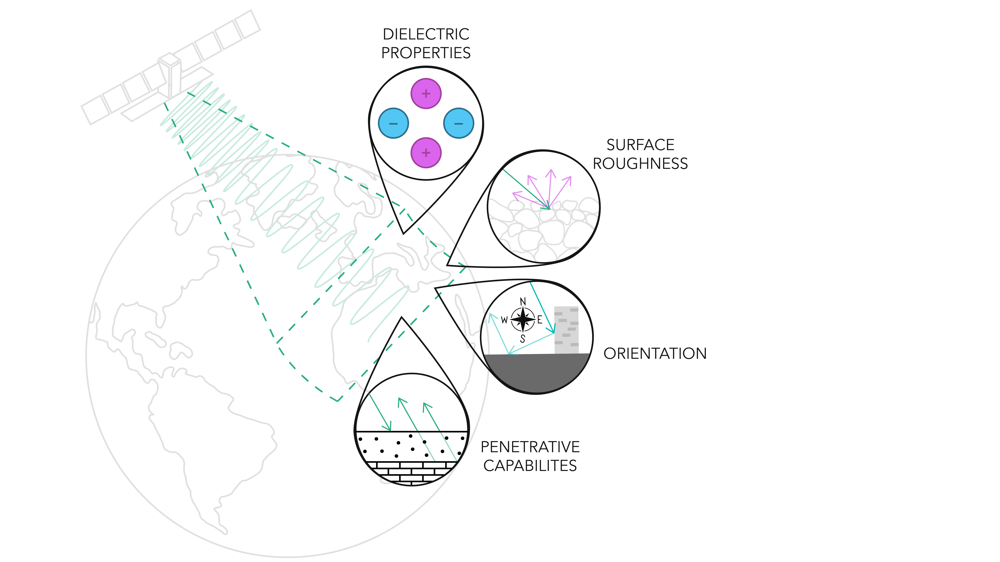</center>
</div>

# Sentinel-1 GRD to ARD Workflow Overview
<div>
    <center>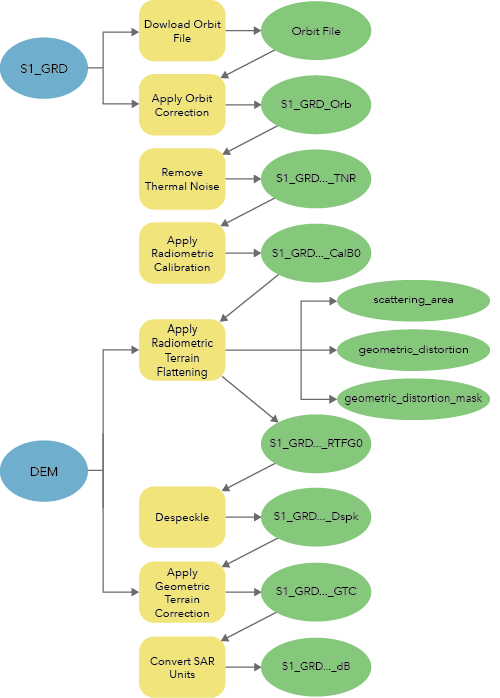</center>
</div>

## Import Modules

In [ ]:
import os
import arcpy

## Check Out Image Analyst Extension License

In [ ]:
arcpy.CheckOutExtension('ImageAnalyst')

## Define Environment Settings

In [ ]:
arcpy.env.workspace = os.getcwd()
arcpy.env.parallelProcessingFactor = '100%'
arcpy.env.pyramid = 'PYRAMIDS -1 BILINEAR DEFAULT'
arcpy.env.addOutputsToMap = True

## Define Input Data 

In [ ]:
in_radar_fname = os.path.join(arcpy.env.workspace,'Input\S1A_IW_GRDH_1SDV_20230225T113347_20230225T113412_047391_05B060_DBAC.SAFE\manifest.safe')
in_dem_fname = os.path.join(arcpy.env.workspace,'Input\dem_SRTMGL1_ortho.tif')
in_polarization = 'VV;VH'

In [ ]:
# List files within .SAFE folder
desc = arcpy.Describe(in_radar_fname)
os.listdir(desc.path)

## Add Data to Map

In [ ]:
# Call current project map
aprx = arcpy.mp.ArcGISProject('CURRENT')
m = aprx.listMaps('Map')[0]

In [ ]:
# Add Sentinel-1 scene to map
in_radar = m.addDataFromPath(in_radar_fname)

In [ ]:
# Add DEM to map
in_dem = m.addDataFromPath(in_dem_fname)

## Download Orbit Data
<div>
    <center>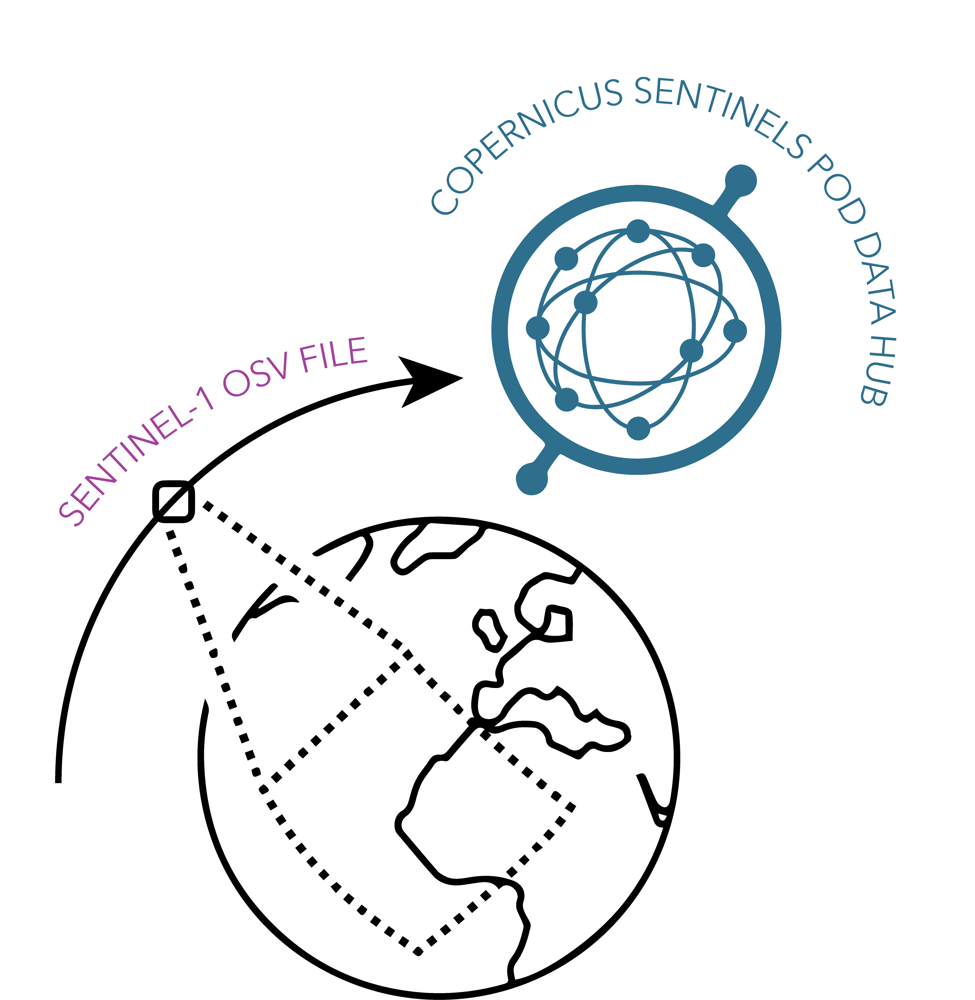</center>
</div>

In [ ]:
# Download updated orbit file
arcpy.ia.DownloadOrbitFile(
    in_radar_data = in_radar,
    orbit_type = 'SENTINEL_RESTITUTED',
    username = 'gnssguest',
    password = 'gnssguest')

In [ ]:
# List files within .SAFE folder
os.listdir(desc.path)

## Update Orbit Data

In [ ]:
# Update orbits using downloaded orbit file
arcpy.ia.ApplyOrbitCorrection(
    in_radar_data = in_radar)

In [ ]:
# List files within .SAFE folder
os.listdir(desc.path)

## Remove Thermal Noise 

In [ ]:
# Mitigate thermal noise
out_radar_TNR = arcpy.ia.RemoveThermalNoise(
    in_radar_data = in_radar,
    polarization_bands = in_polarization)

In [ ]:
# Render thermal noise corrected data
render_out_radar_TNR = arcpy.ia.Render(
    in_raster = out_radar_TNR,
    rendering_rule = { 'numberofStandardDeviations' : 1})

render_out_radar_TNR

In [ ]:
# Render VH band of thermal noise corrected data
render_out_radar_TNR_VH = arcpy.ia.Render(
    in_raster = 'out_radar_TNR',
    rendering_rule = { 'numberofStandardDeviations' : 1,
    'bands': [2]})

render_out_radar_TNR_VH

## Apply Radiometric Calibration 

In [ ]:
#### Radiometrically calibrate to beta-nought
out_radar_TNR_CalB0 = arcpy.ia.ApplyRadiometricCalibration(
    in_radar_data = out_radar_TNR,
    polarization_bands = in_polarization,
    calibration_type = 'BETA_NOUGHT')

In [ ]:
# Render calibrated beta-nought data
render_out_radar_TNR_CalB0 = arcpy.ia.Render(
    in_raster = out_radar_TNR_CalB0,
    rendering_rule = { 'numberofStandardDeviations' : 1})

render_out_radar_TNR_CalB0

## Terrain Flatten

In [ ]:
arcpy.ClearEnvironment('parallelProcessingFactor')

#### Terrain Flatten using DEM and orbit data
out_radar_TNR_CalB0_RTFG0 = arcpy.ia.ApplyRadiometricTerrainFlattening(
    in_radar_data = out_radar_TNR_CalB0,
    in_dem_raster = in_dem,
    geoid = 'GEOID',
    polarization_bands = in_polarization,
    calibration_type = 'GAMMA_NOUGHT',
    out_scattering_area = None,
    out_geometric_distortion = None,
    out_geometric_distortion_mask = None)

In [ ]:
# Render terrain flattened gamma-nought data
render_radar_TNR_CalB0_RTFG0 = arcpy.ia.Render(
    in_raster = out_radar_TNR_CalB0_RTFG0,
    rendering_rule = {'numberofStandardDeviations' : 1})

render_radar_TNR_CalB0_RTFG0

## Despeckle
<div>
    <center>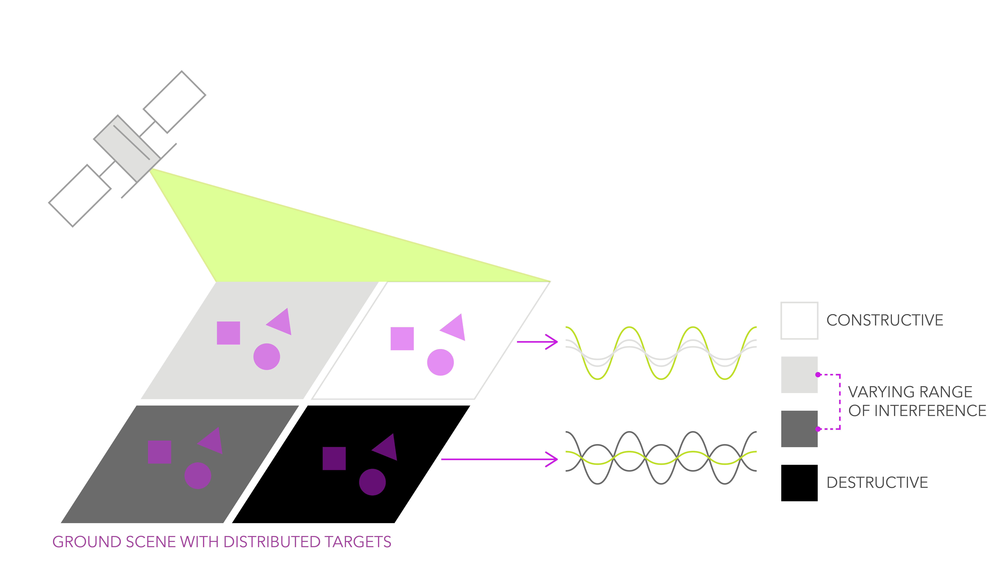</center>
</div>

In [ ]:
arcpy.env.parallelProcessingFactor = '100%'

# Mitigate speckle 
out_radar_TNR_CalB0_RTFG0_Dspk = arcpy.ia.Despeckle(
    in_radar_data = out_radar_TNR_CalB0_RTFG0,
    polarization_bands = in_polarization,
    filter_type = 'GAMMA_MAP',
    filter_size = '9x9')

In [ ]:
# Render despeckled data
render_radar_TNR_CalB0_RTFG0_Dspk = arcpy.ia.Render(
    in_raster = out_radar_TNR_CalB0_RTFG0_Dspk,
    rendering_rule = {'numberofStandardDeviations' : 1})

render_radar_TNR_CalB0_RTFG0_Dspk

## Geometric Terrain Correction
&nbsp;
<div>
    <center>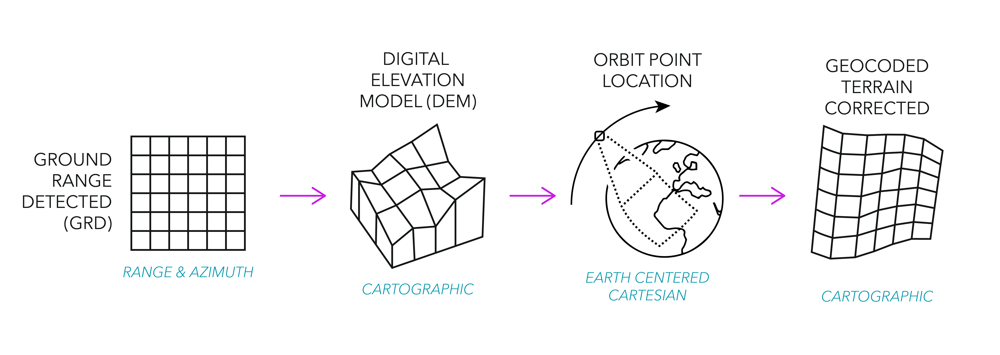</center>
</div>


In [ ]:
# Orthorectify using DEM and orbit data
out_radar_TNR_CalB0_RTFG0_Dspk_GTC = arcpy.ia.ApplyGeometricTerrainCorrection(
    in_radar_data = out_radar_TNR_CalB0_RTFG0_Dspk,
    polarization_bands = in_polarization,
    in_dem_raster = in_dem,
    geoid = 'GEOID')

In [ ]:
# Render orthorectified data
render_radar_TNR_CalB0_RTFG0_Dspk_GTC = arcpy.ia.Render(
    in_raster = out_radar_TNR_CalB0_RTFG0_Dspk_GTC,
    rendering_rule = {'numberofStandardDeviations' : 1})

render_radar_TNR_CalB0_RTFG0_Dspk_GTC

## Convert to Decibels

In [ ]:
# Stretch histogram by scaling the values to decibels
out_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB = arcpy.ia.ConvertSARUnits(
    in_radar_data = out_radar_TNR_CalB0_RTFG0_Dspk_GTC,
    conversion_type = 'LINEAR_TO_DB')

In [ ]:
# Render data in decibels
render_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB = arcpy.ia.Render(
    in_raster = out_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB,
    rendering_rule = {'numberofStandardDeviations' : 1})

render_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB

## Create SAR Color Composite

In [ ]:
out_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB_RGB = arcpy.ia.CreateColorComposite(
    in_raster = out_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB,
    method = 'BAND_NAMES',
    red_expression = 'VV',
    green_expression = 'VH',
    blue_expression = 'VV-VH')

In [ ]:
# Render SAR color composite
render_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB_RGB = arcpy.ia.Render(
    in_raster = out_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB_RGB,
    rendering_rule = {'numberofStandardDeviations' : 1})

render_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB_RGB

In [ ]:
# Create RGB formatted output with appropriate colormap
render_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB_RGB_forceRGB = arcpy.management.CopyRaster(
    in_raster = render_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB_RGB,
    colormap_to_RGB = 'ColormapToRGB',
    pixel_type = '8_BIT_UNSIGNED')

## SAR for Crop Classification
&nbsp;
<div>
    <center>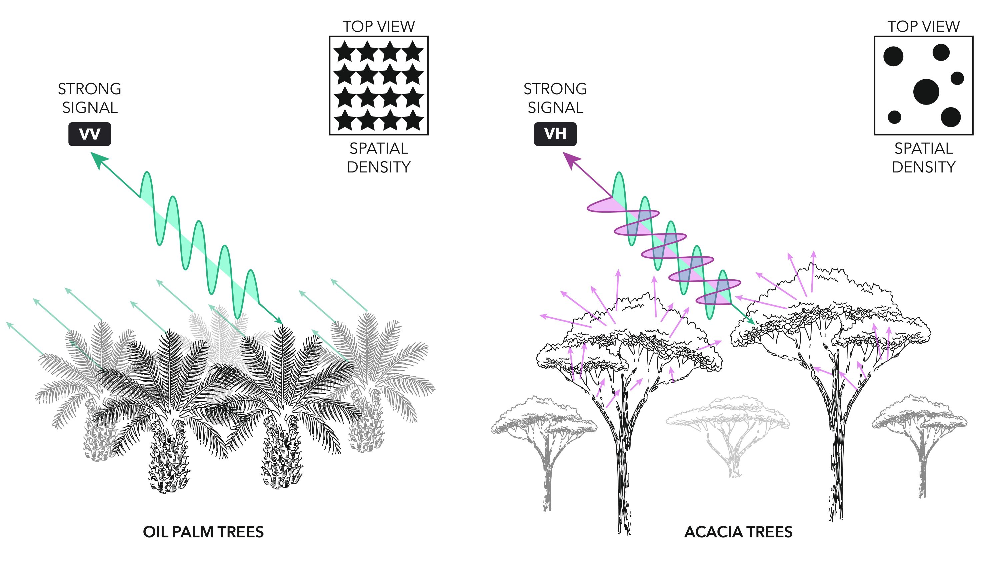</center>
</div>

## SAR for Crop Classification
<div>
    <center>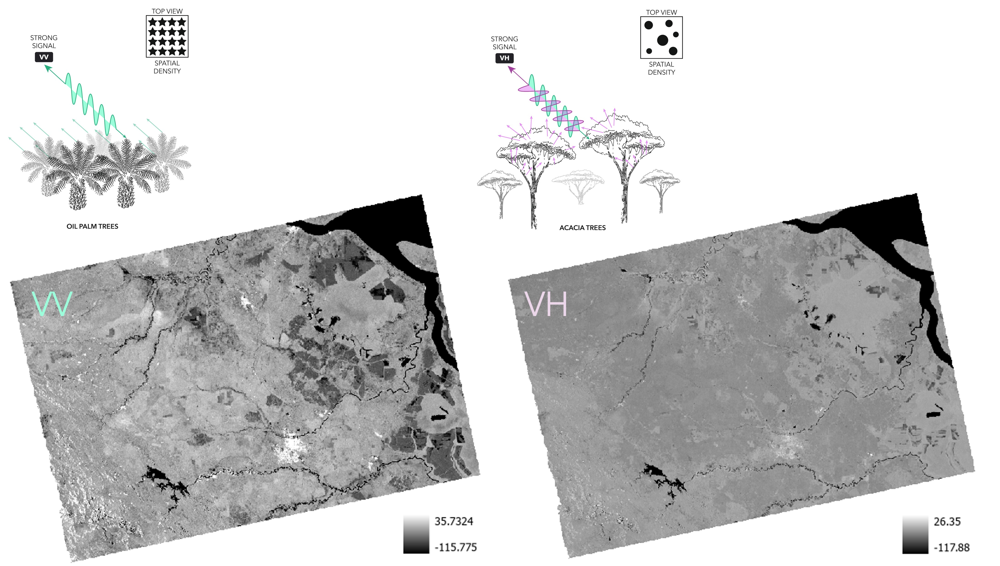</center>
</div>

## Perform Classification on SAR Color Composite

In [ ]:
# Execute Iso Cluster Unsupervised Classification
dB_RGB_8_20_10 = arcpy.sa.IsoClusterUnsupervisedClassification(
    render_radar_TNR_CalB0_RTFG0_Dspk_GTC_dB_RGB_forceRGB,
    Number_of_classes = 8,
    Minimum_class_size = 20,
    Sample_interval = 10)
dB_RGB_8_20_10

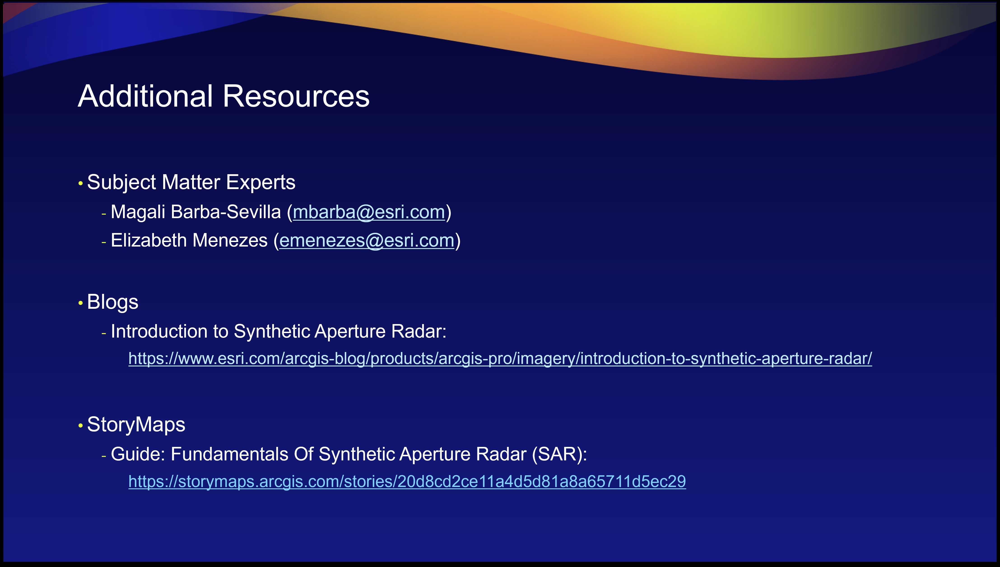

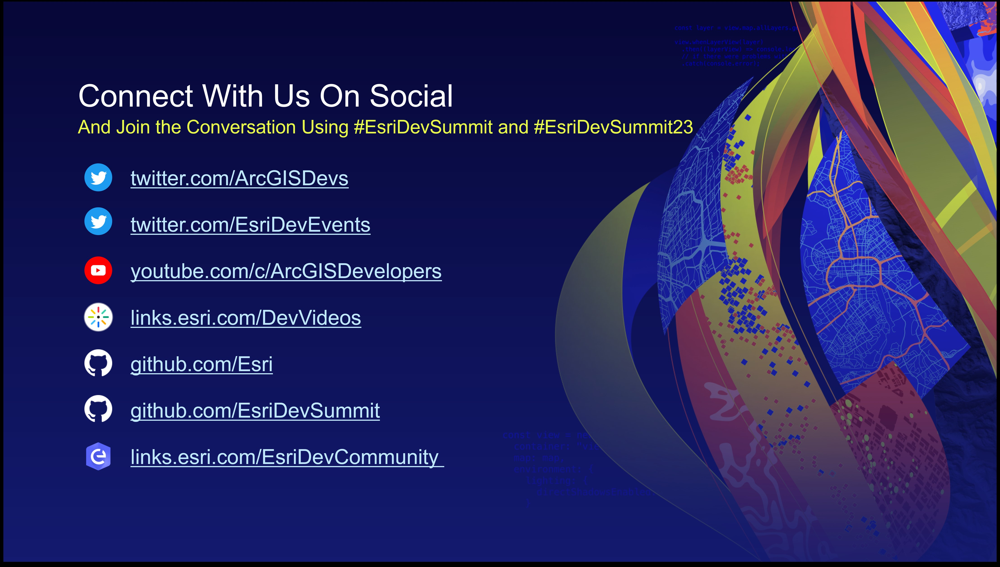

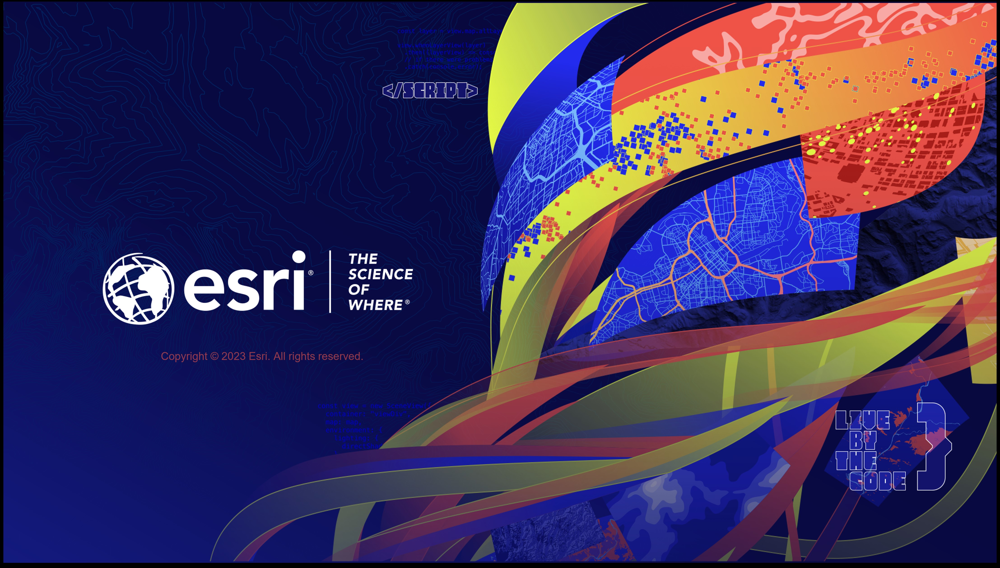